<a href="https://colab.research.google.com/github/dfdrv/Customer_Churn_Prediction/blob/main/Customer_Churn_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import svm
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report

from sklearn.ensemble import VotingClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score, fbeta_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import KFold
from sklearn import feature_selection
from sklearn import model_selection
from sklearn import metrics
from sklearn.metrics import classification_report, precision_recall_curve
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.metrics import make_scorer, recall_score, log_loss
from sklearn.metrics import average_precision_score
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix


In [ ]:
%pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 32.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 65.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=6526ebeb25c254560ef3af87d80a1e44ed99866efedbeb25501dfc989ecdba13
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
from ydata_profiling import ProfileReport

In [ ]:
df = pd.read_csv('telecom_customer_churn.csv')
df.head()

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,...,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,...,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,...,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,...,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,...,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability


**Структура данных**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Married                            7043 non-null   object 
 4   Number of Dependents               7043 non-null   int64  
 5   City                               7043 non-null   object 
 6   Zip Code                           7043 non-null   int64  
 7   Latitude                           7043 non-null   float64
 8   Longitude                          7043 non-null   float64
 9   Number of Referrals                7043 non-null   int64  
 10  Tenure in Months                   7043 non-null   int64  
 11  Offer                              3166 non-null   objec

In [ ]:
df.isnull().sum()

,0
Customer ID,0
Gender,0
Age,0
Married,0
Number of Dependents,0
City,0
Zip Code,0
Latitude,0
Longitude,0
Number of Referrals,0


In [ ]:
df.describe()

,Age,Number of Dependents,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,6361.000000,5517.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,46.509726,0.468692,93486.070567,36.197455,-119.756684,1.951867,32.386767,25.420517,26.189958,63.596131,2280.381264,1.962182,6.860713,749.099262,3034.379056
std,16.750352,0.962802,1856.767505,2.468929,2.154425,3.001199,24.542061,14.200374,19.586585,31.204743,2266.220462,7.902614,25.104978,846.660055,2865.204542
min,19.000000,0.000000,90001.000000,32.555828,-124.301372,0.000000,1.000000,1.010000,2.000000,-10.000000,18.800000,0.000000,0.000000,0.000000,21.360000
25%,32.000000,0.000000,92101.000000,33.990646,-121.788090,0.000000,9.000000,13.050000,13.000000,30.400000,400.150000,0.000000,0.000000,70.545000,605.610000
50%,46.000000,0.000000,93518.000000,36.205465,-119.595293,0.000000,29.000000,25.690000,21.000000,70.050000,1394.550000,0.000000,0.000000,401.440000,2108.640000
75%,60.000000,0.000000,95329.000000,38.161321,-117.969795,3.000000,55.000000,37.680000,30.000000,89.750000,3786.600000,0.000000,0.000000,1191.100000,4801.145000
max,80.000000,9.000000,96150.000000,41.962127,-114.192901,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000


**Получение подробного представления о наборе данных**

In [ ]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Визуализация данных**

In [ ]:
df['Customer Status'].unique()

array(['Stayed', 'Churned', 'Joined'], dtype=object)

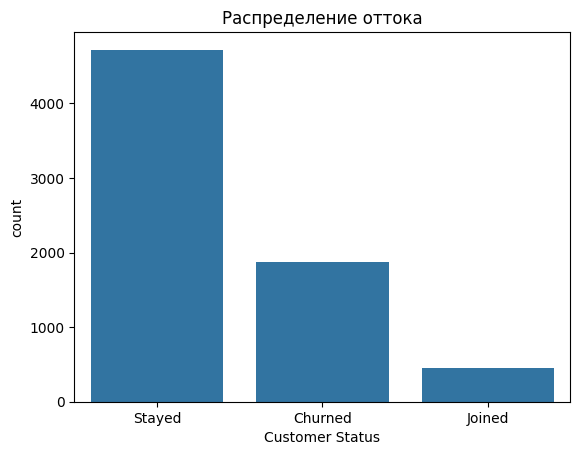

In [ ]:
sns.countplot(x='Customer Status', data=df)
plt.title('Распределение оттока')
plt.show()

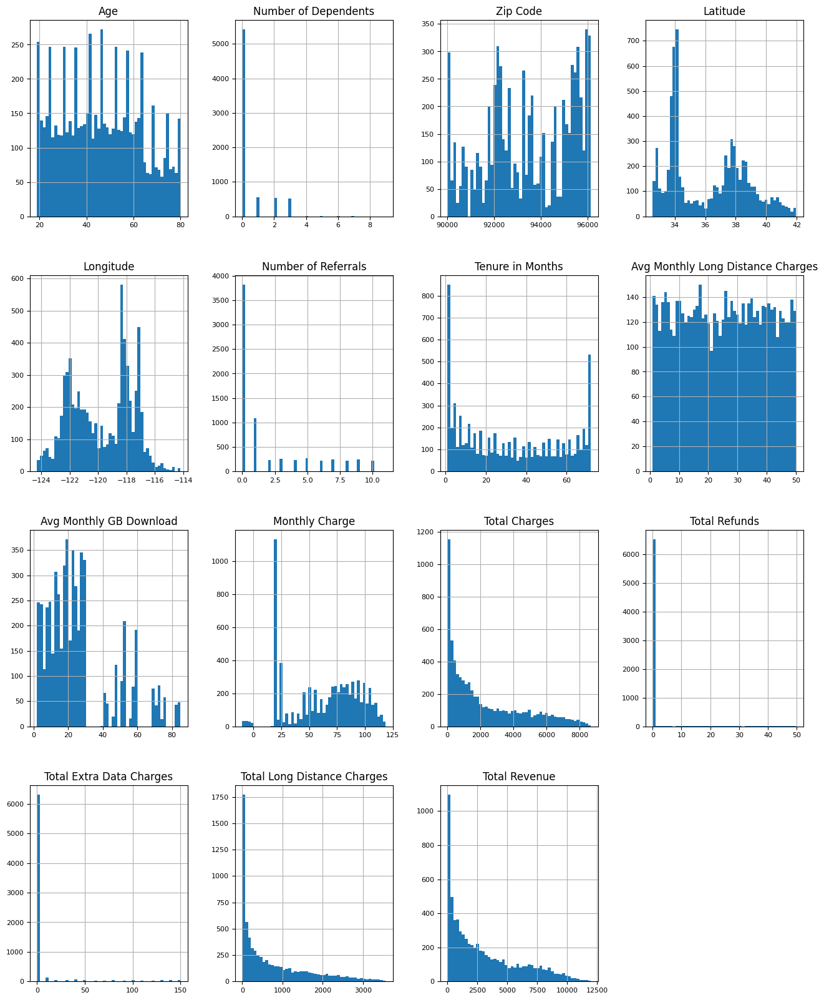

In [ ]:
df_num = df.select_dtypes(include=['int64', 'float64'])
df_num.hist(figsize=(16,20), bins=50, xlabelsize=8, ylabelsize=8)
plt.show()

**Обработка данных**


In [ ]:
df.columns=df.columns.str.replace(" ","").str.lower()

In [ ]:
df.avgmonthlylongdistancecharges=df.avgmonthlylongdistancecharges.fillna(0.0)

Если клиент не имеет интернет-услуги, он не может загружать данные. Поэтому имеет смысл заменить пропущенные значения на 0, чтобы данные были логически непротиворечивыми.

Как и в случае с интернетом, если у клиента нет телефонной услуги, имеет смысл установить расходы на дальние звонки на 0, чтобы данные были логически корректными.

In [ ]:
df.multiplelines=df.multiplelines.fillna('no phone service')

In [ ]:
no_internet=['internettype','onlinesecurity','onlinebackup','deviceprotectionplan','premiumtechsupport','streamingtv',
             'streamingmovies','streamingmusic','unlimiteddata']
df[no_internet]=df[no_internet].fillna('no internet service')

Заполнение пропусков на 'No internet service' делает данные более логичными и предотвращает возникновение путаницы в интерпретации данных.

In [ ]:
df.avgmonthlygbdownload=df.avgmonthlygbdownload.fillna(0)

основываясь на отсутствии корреляции с другими признаками исключим  географические признаки, а также такие столбцы, как категория оттока и причина оттока.

In [ ]:
df=df.drop(columns=['customerid','churncategory','churnreason','totalrefunds','zipcode','longitude','latitude','city'])

In [ ]:
df.shape

(7043, 30)

In [ ]:
df.isnull().sum()

,0
gender,0
age,0
married,0
numberofdependents,0
numberofreferrals,0
tenureinmonths,0
offer,3877
phoneservice,0
avgmonthlylongdistancecharges,0
multiplelines,0


Клиенты, которые только что воспользовались нашими услугами, не дают точного представления о том, как давно они относятся к компании. Чтобы устранить это предубеждение, мы исключим клиентов, которые только что присоединились к нам.

In [ ]:
df=df.loc[~df.customerstatus.str.contains('Join')]
df.reset_index(drop=True,inplace=True)

In [ ]:
import plotly
import plotly.graph_objs as go
import plotly.express as px
import plotly.graph_objects as go
from plotly import offline
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')
import pickle

In [ ]:
type_ = ["No", "yes"]
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Pie(labels=type_, values=df['customerstatus'].value_counts(), name="customerstatus"))

fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Churn Distributions",
    annotations=[dict(text='Churn', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show()

In [ ]:
df.customerstatus[df.customerstatus == 'Stayed'].groupby(by = df.gender).count()

,customerstatus
gender,
Female,2338
Male,2382


In [ ]:
df.customerstatus[df.customerstatus == 'Churned'].groupby(by = df.gender).count()

,customerstatus
gender,
Female,939
Male,930


In [ ]:
fig = px.histogram(df, x="customerstatus", color = "contract", barmode = "group", title = "<b>Customer contract distribution<b>")
fig.update_layout(width=700, height=500, bargap=0.2)
fig.show()

**Кодирование категориальных переменных**

In [ ]:
# Создадим объект для преобразования колонок типа object в int
le = LabelEncoder()
# Кодировка меток будет использоваться для столбцов с 2 или менее уникальными значениеями

le_count = 0
for col in df.columns[1:]:
    if df[col].dtype == 'object':
        if len(list(df[col].unique())) <= 2:
            le.fit(df[col])
            df[col] = le.transform(df[col])
            le_count += 1
print('{} columns were label encoded.'.format(le_count))

5 columns were label encoded.


In [ ]:
df['gender'] = [1 if each == 'Female' else 0 for each in df['gender']]

In [ ]:
df.head()

,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,1,37,1,0,2,9,NaN,1,42.39,No,...,Yes,One Year,1,Credit Card,65.6,593.30,0,381.51,974.81,1
1,0,46,0,0,0,9,NaN,1,10.69,Yes,...,No,Month-to-Month,0,Credit Card,-4.0,542.40,10,96.21,610.28,1
2,0,50,0,0,0,4,Offer E,1,33.65,No,...,Yes,Month-to-Month,1,Bank Withdrawal,73.9,280.85,0,134.60,415.45,0
3,0,78,1,0,1,13,Offer D,1,27.82,No,...,Yes,Month-to-Month,1,Bank Withdrawal,98.0,1237.85,0,361.66,1599.51,0
4,1,75,1,0,3,3,NaN,1,7.38,No,...,Yes,Month-to-Month,1,Credit Card,83.9,267.40,0,22.14,289.54,0


In [ ]:
def encode_data(dataframe):
  """
    Кодирует категориальные данные в числовой формат с использованием
    Label Encoding.

    Параметры:
    ----------
    dataframe : pandas.Series
        Одномерный массив данных, содержащий категориальные значения,
        которые нужно закодировать.

    Возвращает:
    ----------
    pandas.Series
        Закодированный массив данных, где категориальные значения
        заменены на числовые.

    Примечание:
    ----------
    Если входной массив не имеет тип "object", функция не применяет
    преобразование и возвращает исходный массив.
    """
    if dataframe.dtype == "object":
        dataframe = LabelEncoder().fit_transform(dataframe)
    return dataframe

data = df.apply(lambda x: encode_data(x))
data.head()

,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,1,37,1,0,2,9,5,1,42.39,0,...,1,1,1,1,65.6,593.30,0,381.51,974.81,1
1,0,46,0,0,0,9,5,1,10.69,1,...,0,0,0,1,-4.0,542.40,10,96.21,610.28,1
2,0,50,0,0,0,4,4,1,33.65,0,...,1,0,1,0,73.9,280.85,0,134.60,415.45,0
3,0,78,1,0,1,13,3,1,27.82,0,...,1,0,1,0,98.0,1237.85,0,361.66,1599.51,0
4,1,75,1,0,3,3,5,1,7.38,0,...,1,0,1,1,83.9,267.40,0,22.14,289.54,0


In [ ]:
data.to_csv('customer.csv', index=False)

In [ ]:
X = data.drop(columns = "customerstatus")
y = data["customerstatus"].values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 4, stratify =y)

In [ ]:
col=['totalcharges','avgmonthlylongdistancecharges','monthlycharge','totalrevenue','totallongdistancecharges',
     'tenureinmonths','totallongdistancecharges','totalextradatacharges']

In [ ]:
scaler = StandardScaler()
X_train[col] = StandardScaler().fit_transform(X_train[col])
X_test[col] = StandardScaler().fit_transform(X_test[col])

**Обучение нескольких моделей**


**Логистическая регрессия**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve

log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)
y_pred_lr = log_reg.predict(X_test)

**Случайный лес**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

**XGBoost**

In [ ]:
from xgboost import XGBClassifier

xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)

**Определение функции оценки**

In [ ]:
def evaluate_model(y_test, y_pred, model_name):
  """
    Оценивает производительность модели классификации, выводя
    точность, отчет классификации и визуализируя матрицу ошибок.

    Параметры:
    ----------
    y_test : array-like, shape (n_samples,)
        Истинные метки классов для тестового набора данных.

    y_pred : array-like, shape (n_samples,)
        Предсказанные метки классов от модели для тестового набора данных.

    model_name : str
        Название модели, которое будет отображено в выводе.

    Возвращает:
    ----------
    None
        Функция не возвращает значений, но выводит результаты
        оценки модели на экран и визуализирует матрицу ошибок.
    """
    print(f"Модель: {model_name}")
    print("Точность (Accuracy):", accuracy_score(y_test, y_pred))
    print("Отчет классификации:")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f'Матрица ошибок для {model_name}')
    plt.show()

Модель: Логистическая регрессия
Точность (Accuracy): 0.8548305513404147
Отчет классификации:
              precision    recall  f1-score   support

           0       0.75      0.74      0.74       561
           1       0.90      0.90      0.90      1416

    accuracy                           0.85      1977
   macro avg       0.82      0.82      0.82      1977
weighted avg       0.85      0.85      0.85      1977



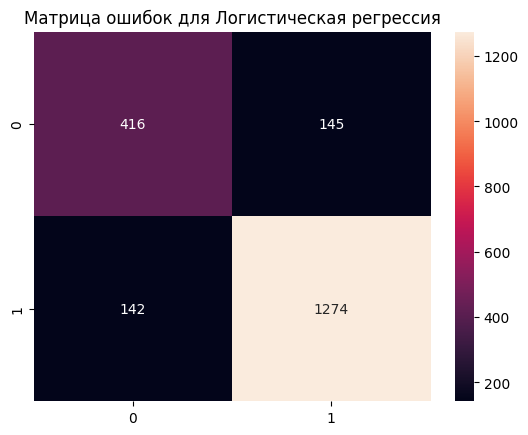

Модель: Случайный лес
Точность (Accuracy): 0.8725341426403642
Отчет классификации:
              precision    recall  f1-score   support

           0       0.84      0.68      0.75       561
           1       0.88      0.95      0.91      1416

    accuracy                           0.87      1977
   macro avg       0.86      0.81      0.83      1977
weighted avg       0.87      0.87      0.87      1977



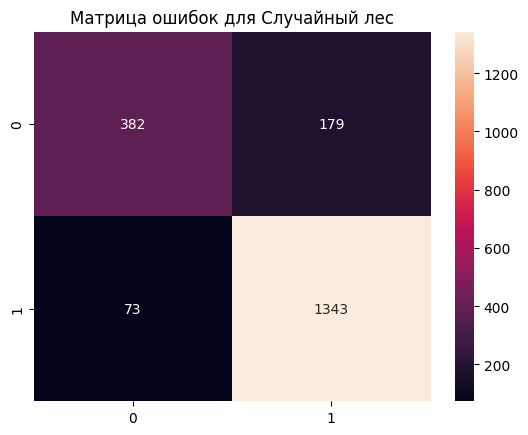

Модель: XGBoost
Точность (Accuracy): 0.8659585230146687
Отчет классификации:
              precision    recall  f1-score   support

           0       0.79      0.71      0.75       561
           1       0.89      0.93      0.91      1416

    accuracy                           0.87      1977
   macro avg       0.84      0.82      0.83      1977
weighted avg       0.86      0.87      0.86      1977



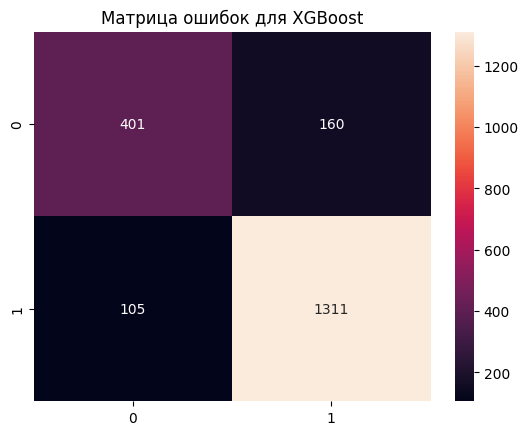

In [ ]:
evaluate_model(y_test, y_pred_lr, 'Логистическая регрессия')
evaluate_model(y_test, y_pred_rf, 'Случайный лес')
evaluate_model(y_test, y_pred_xgb, 'XGBoost')

In [ ]:
models = ['Логистическая регрессия', 'Случайный лес', 'XGBoost']
accuracy = [
    accuracy_score(y_test, y_pred_lr),
    accuracy_score(y_test, y_pred_rf),
    accuracy_score(y_test, y_pred_xgb)
]

roc_auc = [
    roc_auc_score(y_test, log_reg.predict_proba(X_test)[:, 1]),
    roc_auc_score(y_test, rf.predict_proba(X_test)[:, 1]),
    roc_auc_score(y_test, xgb.predict_proba(X_test)[:, 1])
]

performance_df = pd.DataFrame({'Модель': models, 'Точность': accuracy, 'ROC AUC': roc_auc})
performance_df.sort_values(by='ROC AUC', ascending=False)

,Модель,Точность,ROC AUC
2,XGBoost,0.865959,0.929949
1,Случайный лес,0.872534,0.928978
0,Логистическая регрессия,0.854831,0.913893


**Подбор гиперпараметров**

Лучшие параметры:  {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_split': 10, 'n_estimators': 200}
Модель: Случайный лес с подбором гиперпараметров
Точность (Accuracy): 0.8689934243803743
Отчет классификации:
              precision    recall  f1-score   support

           0       0.83      0.67      0.74       561
           1       0.88      0.95      0.91      1416

    accuracy                           0.87      1977
   macro avg       0.86      0.81      0.83      1977
weighted avg       0.87      0.87      0.86      1977



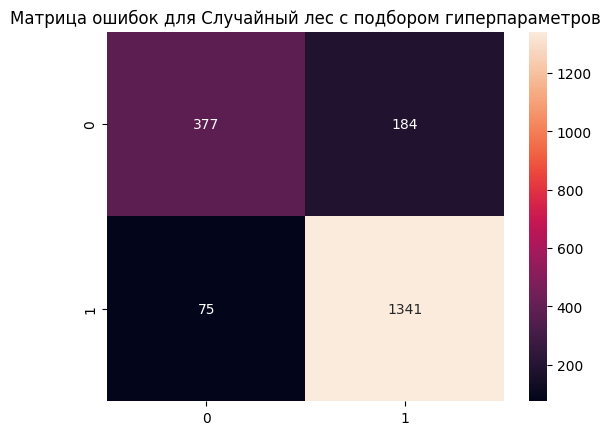

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'max_features': ['auto', 'sqrt'],
    'min_samples_split': [2, 5, 10]
}

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, scoring='roc_auc')
grid_search.fit(X_train, y_train)

print("Лучшие параметры: ", grid_search.best_params_)

best_rf = grid_search.best_estimator_
y_pred_best_rf = best_rf.predict(X_test)
evaluate_model(y_test, y_pred_best_rf, 'Случайный лес с подбором гиперпараметров')

Лучшие параметры для XGBoost:  {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}
Модель: XGBoost с подбором гиперпараметров
Точность (Accuracy): 0.8730399595346484
Отчет классификации:
              precision    recall  f1-score   support

           0       0.80      0.73      0.77       561
           1       0.90      0.93      0.91      1416

    accuracy                           0.87      1977
   macro avg       0.85      0.83      0.84      1977
weighted avg       0.87      0.87      0.87      1977



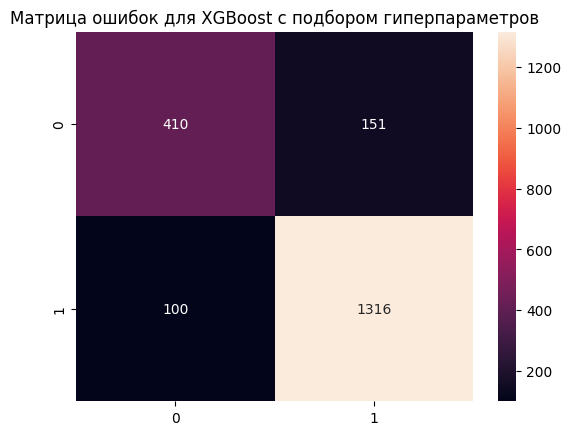

In [ ]:

# Инициализация базовой модели
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

# Определение сетки гиперпараметров
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6],
    'learning_rate': [0.1],
    'subsample': [0.8],
    'colsample_bytree': [0.8]
}


# Настройка GridSearchCV
grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=3, n_jobs=-1, scoring='roc_auc')

# Обучение модели с подбором гиперпараметров
grid_search_xgb.fit(X_train, y_train)

# Печать лучших параметров
print("Лучшие параметры для XGBoost: ", grid_search_xgb.best_params_)

# Обучение с наилучшими параметрами
best_xgb = grid_search_xgb.best_estimator_

# Предсказания
y_pred_best_xgb = best_xgb.predict(X_test)

# Оценка модели
evaluate_model(y_test, y_pred_best_xgb, 'XGBoost с подбором гиперпараметров')


Лучшие параметры для логистической регрессии:  {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
Модель: Логистическая регрессия с подбором гиперпараметров
Точность (Accuracy): 0.855336368234699
Отчет классификации:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75       561
           1       0.90      0.90      0.90      1416

    accuracy                           0.86      1977
   macro avg       0.82      0.82      0.82      1977
weighted avg       0.86      0.86      0.86      1977



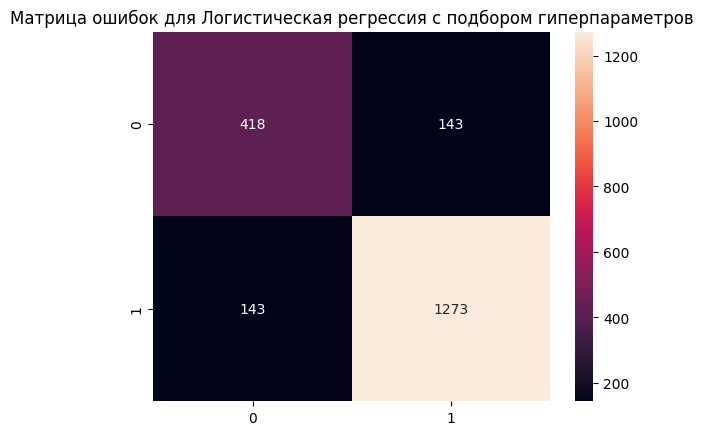

In [ ]:


# Инициализация базовой модели
log_reg = LogisticRegression(max_iter=1000)

# Определение сетки гиперпараметров
param_grid = {
    'C': [0.1, 1, 10],
    'penalty': ['l2'],  # Используй только 'l2' для ускорения
    'solver': ['liblinear']  # Используй 'liblinear' для малых данных
}


# Настройка GridSearchCV
grid_search_lr = GridSearchCV(estimator=log_reg, param_grid=param_grid, cv=3, n_jobs=-1, scoring='roc_auc')

# Обучение модели с подбором гиперпараметров
grid_search_lr.fit(X_train, y_train)

# Печать лучших параметров
print("Лучшие параметры для логистической регрессии: ", grid_search_lr.best_params_)

# Обучение с наилучшими параметрами
best_log_reg = grid_search_lr.best_estimator_

# Предсказания
y_pred_best_lr = best_log_reg.predict(X_test)

# Оценка модели
evaluate_model(y_test, y_pred_best_lr, 'Логистическая регрессия с подбором гиперпараметров')


**Анализ результатов:**

Точность немного повысилась. Это показывает, что подбираемые гиперпараметры не принесли значительных изменений в общую производительность модели.
Стабильность метрик:

Precision, Recall и F1-score для класса 0 остались неизменными, что указывает на стабильность модели для этой категории клиентов.
Показатели для класса 1 (ушедшие клиенты) также остались прежними, что означает, что модель продолжает хорошо предсказывать уход клиентов.
Сравнение макро- и взвешенных средних:

Макро-усредненные значения для обеих моделей одинаковы, что говорит о сбалансированности результатов между классами.
Взвешенные усредненные значения показателей увеличились, что может указывать на более точное предсказание, однако разница невелика.

**Улучшение модели с помощью способа предсказания класса для моделей, используя вероятностный выход**

Модель: Случайный лес с порогом 0.3
Точность (Accuracy): 0.8411734951947395
Отчет классификации:
              precision    recall  f1-score   support

           0       0.96      0.46      0.62       561
           1       0.82      0.99      0.90      1416

    accuracy                           0.84      1977
   macro avg       0.89      0.73      0.76      1977
weighted avg       0.86      0.84      0.82      1977



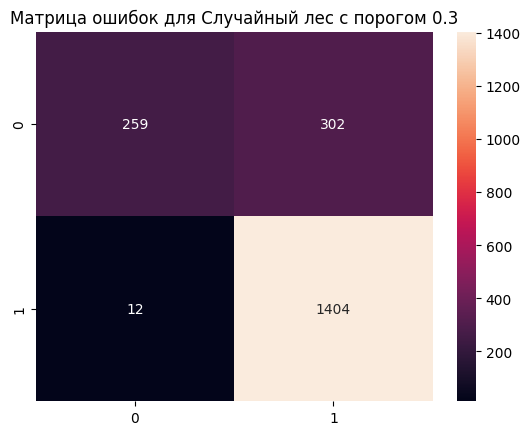

In [ ]:
y_pred_proba = best_rf.predict_proba(X_test)[:,1]
threshold = 0.3
y_pred_threshold = (y_pred_proba >= threshold).astype(int)
evaluate_model(y_test, y_pred_threshold, f'Случайный лес с порогом {threshold}')

Модель: Логистическая регрессия с порогом 0.4
Точность (Accuracy): 0.8548305513404147
Отчет классификации:
              precision    recall  f1-score   support

           0       0.80      0.65      0.72       561
           1       0.87      0.94      0.90      1416

    accuracy                           0.85      1977
   macro avg       0.84      0.79      0.81      1977
weighted avg       0.85      0.85      0.85      1977



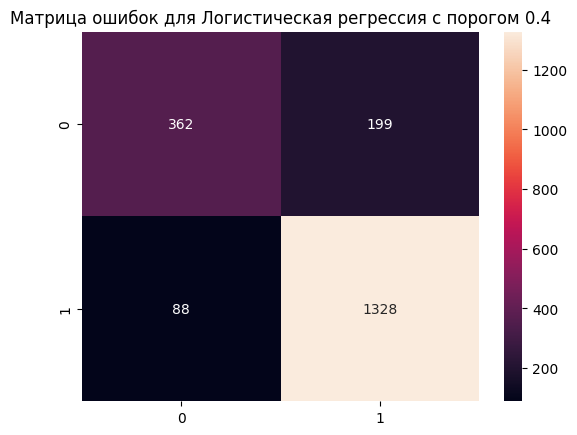

In [ ]:
# Получение вероятностей предсказаний
y_pred_proba_lr = best_log_reg.predict_proba(X_test)[:, 1]

# Установка пользовательского порога
threshold_lr = 0.3
y_pred_threshold_lr = (y_pred_proba_lr >= threshold_lr).astype(int)

# Оценка модели с новым порогом
evaluate_model(y_test, y_pred_threshold_lr, f'Логистическая регрессия с порогом {threshold_lr}')


Модель: XGBoost с порогом 0.3
Точность (Accuracy): 0.8593829033889732
Отчет классификации:
              precision    recall  f1-score   support

           0       0.88      0.58      0.70       561
           1       0.85      0.97      0.91      1416

    accuracy                           0.86      1977
   macro avg       0.87      0.78      0.80      1977
weighted avg       0.86      0.86      0.85      1977



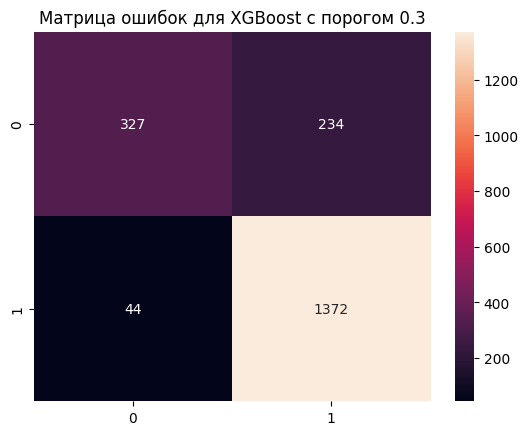

In [ ]:
# Получение вероятностей предсказаний
y_pred_proba_xgb = best_xgb.predict_proba(X_test)[:, 1]

# Установка пользовательского порога
threshold_xgb = 0.3
y_pred_threshold_xgb = (y_pred_proba_xgb >= threshold_xgb).astype(int)

# Оценка модели с новым порогом
evaluate_model(y_test, y_pred_threshold_xgb, f'XGBoost с порогом {threshold_xgb}')


**Анализ результатов:**


Точность модели уменьшилась. Это указывает на то, что общая производительность модели стала хуже после изменения порога.
Изменение метрик для класса 0:

Precision для класса 0 (не ушедшие клиенты) значительно увеличился, что указывает на более точные предсказания, когда модель говорит, что клиент не ушел.
Recall для класса 0 уменьшился. Это означает, что модель стала менее чувствительной к уходящим клиентам, и пропускает больше случаев, когда клиент на самом деле ушел.
Изменение метрик для класса 1:

Recall для класса 1 (ушедшие клиенты) увеличился, что указывает на то, что модель теперь почти все уходящие клиенты классифицирует правильно.
Precision для класса 1 снизился. Это означает, что среди предсказанных уходящих клиентов больше ложных срабатываний.
Макро-усредненные и взвешенные метрики:

Макро-усредненные значения показывают, что баланс между классами сместился в сторону класса 1, что подтверждается увеличением Recall, но ухудшением Precision для обоих классов.
Взвешенные усредненные метрики остаются более стабильными, однако значение F1-score для класса 0 сильно снизилось, что может указывать на проблемы в бизнес-целях, связанных с уходящими клиентами.